<h1 style='background:#0A4D68; border:3; color:cyan; border-color:cyan; border-style:dotted;'><center> TELCO CHURN PREDICTION</center></h1> 

<center>
<img style="align:center;" src="https://media.licdn.com/dms/image/C5612AQG0Gilk9mJpxw/article-cover_image-shrink_720_1280/0/1621963349834?e=2147483647&v=beta&t=S-3_jI-4xWu14OSyh7RJg93TQmLc_QWTZAW5Gd_aL8s" width=900>
</center>

<h1 style='background:#0A4D68; border:3; color:cyan; border-color:cyan; border-style:dotted;'><center> TABLE OF CONTENT</center></h1> 


<a id='1' style="color:cyan ">1. IMPORTING LIBRARIES</a>

<a id='2' style="color:cyan ">2. LOADING DATASET</a>

<a id='3' style="color:cyan ">3. DATA DESCRIPTION</a>

<a id='4' style="color:cyan ">4. EXPLORATORY DATA ANALYSIS</a>

<a id='6' style="color:cyan ">5. FEATURE ENGINEERING</a>

<a id='5' style="color:cyan ">6. MISSING VALUES</a>

<a id='7' style="color:cyan ">7. DATA VISUALIZATION</a>

<a id='8' style="color:cyan ">8. OUTLIER DETECTION</a>

<a id='9' style="color:cyan ">9. DATA PREPROCESSING</a>

<a id='10' style="color:cyan ">10. MODEL TRAINING AND EVALUATING</a>

<a id='11' style="color:cyan ">11. FEATURE IMPORTANCE</a>

<a id='12' style="color:cyan ">12 AUC-ROC</a>

<a id='13' style="color:cyan ">13. MODEL TUNING</a>

<a id='14' style="color:cyan ">14. CONCLUSION</a>

                      
</div>


<h1 style='background:#0A4D68; border:3; color:cyan; border-color:cyan; border-style:dotted;'><center> IMPORTING LIBRARIES</center></h1> 

In [2]:
#importing libraries
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import colors
import plotly.graph_objs as go
from plotly.offline import iplot
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
from scipy import stats
from scipy.stats import norm, skew
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split,KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate 
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report,roc_auc_score,roc_curve
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score,f1_score,precision_score,recall_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.2f}'.format
pd.options.mode.chained_assignment = None

<h1 style='background:#0A4D68; border:3; color:cyan; border-color:cyan; border-style:dotted;'><center> LOADING DATASET</center></h1> 

In [3]:
data=pd.read_csv("datasets\\Telco-Customer-Churn.csv")
df=data.copy()
df.head().style.set_properties(**{'background-color': 'black',
                            'color': 'cyan',
                            'border-color': 'white'})

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.850000,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.950000,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.850000,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.300000,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.700000,151.65,Yes


<h1 style='background:#0A4D68; border:3; color:cyan; border-color:cyan; border-style:dotted;'><center> DATASET DESCRIPTION</center></h1> 

# Analysis of data columns to identify independent and dependent variables:

### X is the independent variables - the variables we are using to make predictions

* customerID - unique value identifying customer
* gender - whether the customer is a male or a female
* SeniorCitizen - whether the customer is a senior citizen or not (1, 0)
* Partner - whether the customer has a partner or not (Yes, No)
* Dependents - whether the customer has dependents or not (Yes, No). A dependent is a person who relies on another as a primary source of income,
* tenure - number of months the customer has stayed with the company
* PhoneService - whether the customer has a phone service or not (Yes, No)
* MultipleLines - whether the customer has multiple lines or not (Yes, No, No phone service)
* InternetService - customer’s internet service provider (DSL, Fiber optic, No)
* OnlineSecurity - whether the customer has online security or not (Yes, No, No internet service)
* OnlineBackup - whether the customer has online backup or not (Yes, No, No internet service)
* DeviceProtection - whether the customer has device protection or not (Yes, No, No internet service)
* TechSupport - whether the customer has tech support or not (Yes, No, No internet service)
* StreamingTV - whether the customer has streaming TV or not (Yes, No, No internet service)
* StreamingMovies - whether the customer has streaming movies or not (Yes, No, No internet service)
* Contract - type of contract according to duration (Month-to-month, One year, Two year)
* PaperlessBilling - bills issued in paperless form (Yes, No)
* PaymentMethod - payment method used by customer (Electronic check, Mailed check, Credit card (automatic), Bank transfer (automatic))
* MonthlyCharges - amount of charge for service on monthly bases
* TotalCharges - cumulative charges for service during subscription (tenure) period
### y is dependent variable - variable we are trying to predict or estimate

<h1 style='background:#0A4D68; border:3; color:cyan; border-color:cyan; border-style:dotted;'><center> EXPLORATORY ANALYSIS</center></h1> 

In [4]:
print('Shape of the data:',df.shape)
print("****************************")
print('Columns of the data:',df.columns)
print("****************************")
print('Number of unique values:',df.nunique())
print("****************************")
print('Number of duplicated values:',df.duplicated().sum())

Shape of the data: (7043, 21)
****************************
Columns of the data: Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')
****************************
Number of unique values: customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharg

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


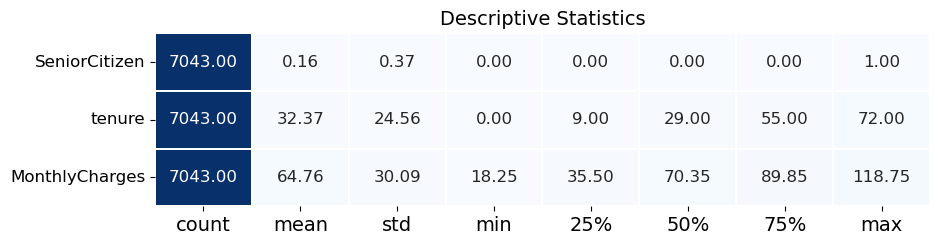

In [6]:
# describe the data
cols=df.select_dtypes(include=['float64','int64'])
cmap1 = 'Blues'
def desc_stats(dataframe):
    desc = dataframe.describe().T
    f,ax = plt.subplots(figsize=(10,
                                 desc.shape[0] * 0.75))
    sns.heatmap(desc,
                annot = True,
                cmap = cmap1,
                fmt= '.2f',
                ax = ax,
                linecolor = 'white',
                linewidths = 1.3,
                cbar = False,
                annot_kws = {"size": 12})
    plt.xticks(size = 14)
    plt.yticks(size = 12,
               rotation = 0)
    plt.title("Descriptive Statistics", size = 14)
    plt.show()
    
desc_stats(cols)

In [7]:
# grabbing numeric and categorical columns:
def cat_num_cols(dataframe,cat_th=12,car_th=20):
    
    cat_cols=[col for col in dataframe.columns if dataframe[col].dtypes=="O"]
    num_but_cat=[col for col in dataframe.columns if dataframe[col].nunique()<cat_th and 
                dataframe[col].dtypes!="O"]
    cat_but_car=[col for col in dataframe.columns if dataframe[col].nunique()>car_th and 
                dataframe[col].dtypes=="O"]
    cat_cols=cat_cols+num_but_cat
    cat_cols=[col for col in cat_cols if col not in cat_but_car]
    
    num_cols=[col for col in dataframe.columns if dataframe[col].dtypes!="O"]
    num_cols=[col for col in num_cols if col not in num_but_cat]
    
    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')
    
    return cat_cols,num_cols,cat_but_car,num_but_cat


num_but_cat,cat_but_car,cat_cols,num_cols=cat_num_cols(df)


# aranging type of data:
df["TotalCharges"]=pd.to_numeric(df["TotalCharges"],errors="coerce")

Observations: 7043
Variables: 21
cat_cols: 17
num_cols: 2
cat_but_car: 2
num_but_cat: 1


In [8]:
# distribution of categorical variables:


cat_cols = [col for col in df.columns if df[col].dtypes == "O" and df[col].nunique() <= 12]

# def cat_summary(df,col):
#     print(pd.DataFrame({col:df[col].value_counts(),
#                        "Ratio":100*df[col].value_counts()/len(df)}))
#     print("##########################################")
#     plt.figure(figsize=(10,5))
#     sns.countplot(x=col,data=df,palette=colors,order=df[col].value_counts().index)
#     plt.title(col)
#     plt.show()


colors = ['#7DBCE6','#EEBDEE','#EAEAAF','#8FE195','#E28181',
          '#87D8DB','#C2E37D','#DF93A4','#DCB778','#C497DE']


def cat_summary(dataframe, col):
    print(pd.DataFrame({col:df[col].value_counts(),
                       "Ratio":100*df[col].value_counts()/len(df)}))

    fig = make_subplots(rows=1,cols=1,
                        subplot_titles=('Distribution'))
    fig.add_trace(go.Bar(x=dataframe[col].value_counts().index,
                            y=dataframe[col].value_counts().values,
                            marker=dict(color=colors)),row=1,col=1)
    
    
  
    fig.update_layout(title = {'text': col,
                               'y':0.9,
                               'x':0.5,
                               'xanchor': 'center',
                               'yanchor': 'top'},
                      template = "plotly_dark",width=400,height=400)
    
    iplot(fig) # to show the plot in notebook with optimized design

for i in cat_cols:
    cat_summary(df,i)


        gender  Ratio
gender               
Male      3555  50.48
Female    3488  49.52


         Partner  Ratio
Partner                
No          3641  51.70
Yes         3402  48.30


            Dependents  Ratio
Dependents                   
No                4933  70.04
Yes               2110  29.96


              PhoneService  Ratio
PhoneService                     
Yes                   6361  90.32
No                     682   9.68


                  MultipleLines  Ratio
MultipleLines                         
No                         3390  48.13
Yes                        2971  42.18
No phone service            682   9.68


                 InternetService  Ratio
InternetService                        
Fiber optic                 3096  43.96
DSL                         2421  34.37
No                          1526  21.67


                     OnlineSecurity  Ratio
OnlineSecurity                            
No                             3498  49.67
Yes                            2019  28.67
No internet service            1526  21.67


                     OnlineBackup  Ratio
OnlineBackup                            
No                           3088  43.84
Yes                          2429  34.49
No internet service          1526  21.67


                     DeviceProtection  Ratio
DeviceProtection                            
No                               3095  43.94
Yes                              2422  34.39
No internet service              1526  21.67


                     TechSupport  Ratio
TechSupport                            
No                          3473  49.31
Yes                         2044  29.02
No internet service         1526  21.67


                     StreamingTV  Ratio
StreamingTV                            
No                          2810  39.90
Yes                         2707  38.44
No internet service         1526  21.67


                     StreamingMovies  Ratio
StreamingMovies                            
No                              2785  39.54
Yes                             2732  38.79
No internet service             1526  21.67


                Contract  Ratio
Contract                       
Month-to-month      3875  55.02
Two year            1695  24.07
One year            1473  20.91


                  PaperlessBilling  Ratio
PaperlessBilling                         
Yes                           4171  59.22
No                            2872  40.78


                           PaymentMethod  Ratio
PaymentMethod                                  
Electronic check                    2365  33.58
Mailed check                        1612  22.89
Bank transfer (automatic)           1544  21.92
Credit card (automatic)             1522  21.61


       Churn  Ratio
Churn              
No      5174  73.46
Yes     1869  26.54


In [9]:
# distribution of numerical variables:

features=["tenure","MonthlyCharges","TotalCharges"]



colors = ['#7DBCE6','#EEBDEE','#EAEAAF','#8FE195','#E28181',
          '#87D8DB','#C2E37D','#DF93A4','#DCB778','#C497DE']


def num_summary(dataframe, col):

    fig = make_subplots(rows=1,cols=2,
                        subplot_titles=('Quantiles','Distribution'))

    fig.add_trace(go.Histogram(x = dataframe[col],
                               xbins = dict(start = dataframe[col].min(),
                                            end = dataframe[col].max()),
                               showlegend = False,
                               name = str(col),
                               marker=dict(color=colors[8],
                                           line = dict(color = '#DBE6EC',
                                                       width = 1))
                              ),
                  row = 1, col = 1)
    
    fig.add_trace(go.Box(y=dataframe[col],
                         name = str(col),
                         showlegend = False,
                         marker_color = colors[3]),
                  row = 1, col = 2)
    
    
  
    fig.update_layout(title = {'text': col,
                               'y':0.9,
                               'x':0.5,
                               'xanchor': 'center',
                               'yanchor': 'top'},
                      template = "plotly_dark")
    
    iplot(fig)

for i in df[features].columns:
    num_summary(df,i)

<h1 style='background:#0A4D68; border:4; color:cyan; border-color:cyan; border-style:dotted;'><center> MISSING VALUES</center></h1> 

In [10]:
# show the missing values in dataset with ratio
def missing_values_tabl(df):
    
    na_columns = [col for col in df.columns if df[col].isnull().sum() > 0]
    n_miss = df[na_columns].isnull().sum().sort_values(ascending=False)
    ratio = (df[na_columns].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio,2)], axis=1, keys=['n_miss', 'ratio'])
    missing_df = pd.DataFrame(missing_df)
    return missing_df

missing_values_tabl(df)

,n_miss,ratio
TotalCharges,11,0.16


In [11]:
# showing rows with NaN values
df[df.isnull().any(axis=1)]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


In [12]:
# filling missing values with KNNImputer
from sklearn.impute import KNNImputer
knn=KNNImputer(n_neighbors=15)
num=df.select_dtypes(include=['float64','int64'])    
for i in num.columns:
   df[i]=knn.fit_transform(df[[i]])
      
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

<h1 style='background:#0A4D68; border:2; color:cyan; border-color:cyan; border-style:dotted;'><center>OUTLIER DETECTION</center></h1> 

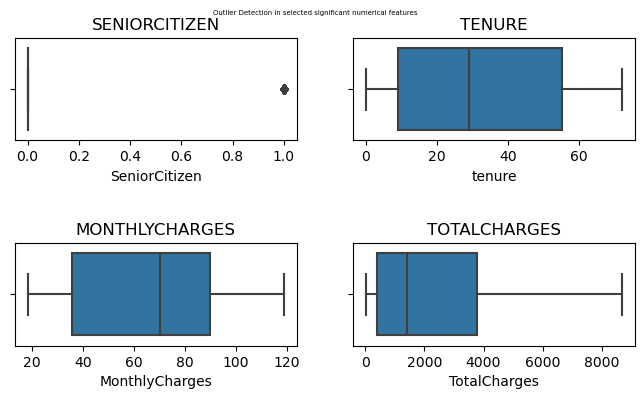

In [13]:
# Selecting related features:
num=df.select_dtypes(include=['int64','float64'])



fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(8, 4))
plt.subplots_adjust(hspace=1)
fig.suptitle("Outlier Detection in selected significant numerical features", fontsize=5, y=0.95)

# loop through tickers and axes
for ticker, ax in zip(num, axs.ravel()):
    # filter df for ticker and plot on specified axes
    sns.boxplot(data=num, x=ticker, ax=ax)
    # chart formatting
    ax.set_title(ticker.upper())


plt.show()

In [14]:
#  outlier threshold:
def outlier_thresholds(dataframe,col_name,q1=0.5,q3=0.95):
    q1=dataframe[col_name].quantile(q1)
    q3=dataframe[col_name].quantile(q3)
    IQR=q3-q1
    
    up_limit=q3+1.5*IQR
    low_limit=q1-1.5*IQR
    
    return low_limit,up_limit

# check outliers:
def check_outliers(dataframe,col_name):
    low_limit,up_limit=outlier_thresholds(dataframe,col_name)
    if dataframe[(dataframe[col_name]<low_limit) | (dataframe[col_name]>up_limit)].any(axis=None):
        return True 
   
    else:
        return False

In [15]:
# replacing outliers with thresholds:
def replace_with_thresholds(dataframe, col):
    low_limit, up_limit = outlier_thresholds(dataframe, col)
    if low_limit > 0:
        dataframe.loc[(dataframe[col] < low_limit), col] = low_limit
        dataframe.loc[(dataframe[col] > up_limit), col] = up_limit
    else:
        dataframe.loc[(dataframe[col] > up_limit), col] = up_limit

features=["tenure","MonthlyCharges","TotalCharges"]

for i in df[features].columns:
    
    replace_with_thresholds(df,i)
    print(i, ":", check_outliers(df, i))


tenure : False
MonthlyCharges : False
TotalCharges : False


<h1 style='background:#0A4D68; border:2; color:cyan; border-color:cyan; border-style:dotted;'><center>DATA VISUALIZATION</center></h1> 

Text(0.5, 1.0, 'Correlation Between Features')

<Figure size 4000x2000 with 0 Axes>

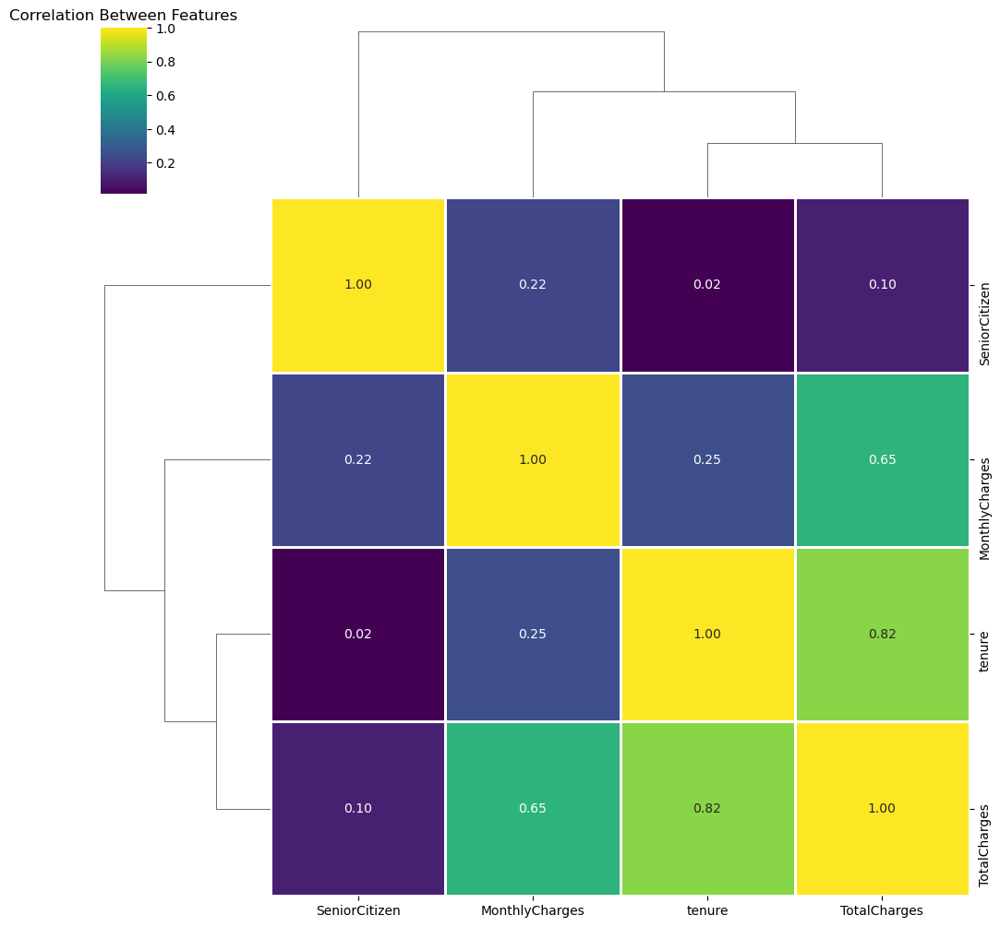

In [16]:
# correlation matrix:
num_cols = df.select_dtypes(include=np.number)

corr=num_cols.corr()
plt.figure(figsize=(40,20))
sns.clustermap(corr,cmap="viridis",linewidths=.75,annot=True,fmt=".2f")
plt.title("Correlation Between Features")

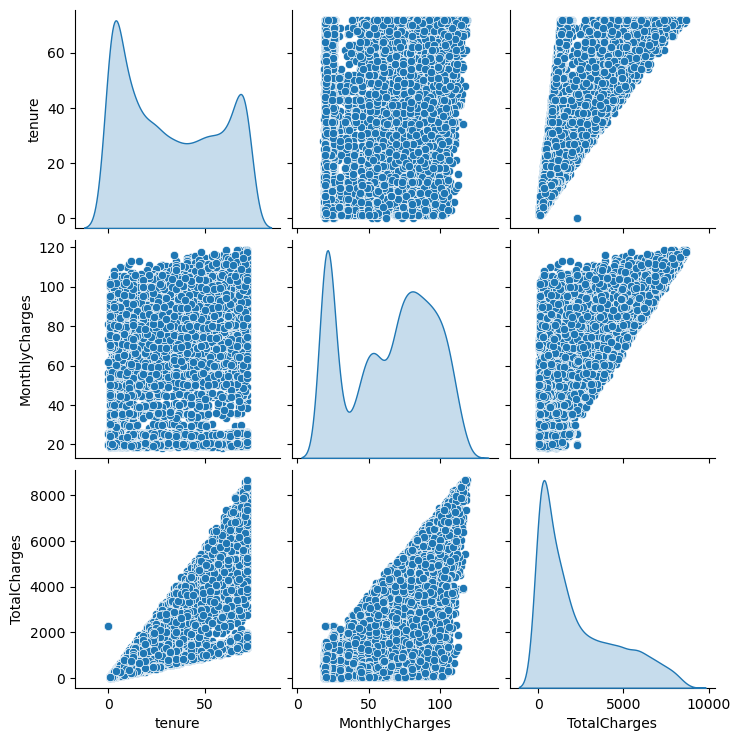

In [17]:
# pairplot of numerical features

num= df.select_dtypes(include = np.number)
num.drop(['SeniorCitizen'], axis=1, inplace=True)

sns.pairplot(num, kind="scatter", diag_kind="kde", palette="husl", height=2.5)

In [18]:
# relationship between InternetService and Churn
px.histogram(df,x="InternetService",color="Churn",title="relationship between InternetService and Churn",template="plotly_dark",opacity=0.8,hover_data=df.columns,
             marginal="box",barmode="group",width=800,height=400,color_discrete_sequence=["#2CD3E1","#A459D1"])

In [19]:
# relationship between contract and total charges

px.histogram(df, x="Contract", y="TotalCharges", color="Contract", title=" relationship between contract and total charges",
             labels={"Contract": "Contract Type", "TotalCharges": "Total Charges"},template="plotly_dark",marginal="box" ,width=800, height=500,
             category_orders={"Contract": ["Month-to-month", "One year", "Two year"]},color_discrete_sequence=["#636EFA", "#EF553B", "#00CC96"])

In [20]:
# relationship between gender and total charges

fig=px.pie(df,values=df["TotalCharges"],names=df["gender"],title="elationship between gender and total charges",color="gender",
       color_discrete_map={'Male':'cyan',
                                 'Female':'darkblue'},template="plotly_dark",hole=0.3,width=500,height=500,opacity=0.8,
       hover_data=['TotalCharges'])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [21]:
# relatioship between payment method and churn

px.histogram(df, x="PaymentMethod", color="Churn", barmode="group", title="Payment Method vs Churn", width=800, height=400, template="plotly_dark")

In [22]:
# Tenure and TotalCharges:

px.scatter(df, x="tenure", y="TotalCharges", color="Churn", marginal_y="violin",
            marginal_x="box", trendline="ols", template="plotly_dark", title="Tenure and TotalCharges",size="MonthlyCharges")

<h1 style='background:#0A4D68; border:2; color:cyan; border-color:cyan; border-style:dotted;'><center>OUTLIER DETECTION</center></h1> 

In [23]:
features=["tenure","TotalCharges","MonthlyCharges"]

for i in df[features].columns:
    fig=px.box(df,y=i,color=df["Churn"],title=i,width=500,height=500,template="plotly_dark")
    fig.show()

In [24]:
#  outlier threshold:
def outlier_thresholds(dataframe,col_name,q1=0.25,q3=0.75):
    q1=dataframe[col_name].quantile(q1)
    q3=dataframe[col_name].quantile(q3)
    IQR=q3-q1
    
    up_limit=q3+1.5*IQR
    low_limit=q1-1.5*IQR
    
    return low_limit,up_limit

# check outliers:
def check_outliers(dataframe,col_name):
    low_limit,up_limit=outlier_thresholds(dataframe,col_name)
    if dataframe[(dataframe[col_name]<low_limit) | (dataframe[col_name]>up_limit)].any(axis=None):
        return True 
   
    else:
        return False

for i in df[features].columns:
    print(i,check_outliers(df,i))

tenure False
TotalCharges False
MonthlyCharges False


<h1 style='background:#0A4D68; border:2; color:cyan; border-color:cyan; border-style:dotted;'><center>DATA PREPROCESSING</center></h1> 

In [25]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0.00,Yes,No,1.00,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0.00,No,No,34.00,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0.00,No,No,2.00,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0.00,No,No,45.00,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0.00,No,No,2.00,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [26]:
# LABEL ENCODING:
df.drop("customerID", axis=1, inplace=True)

def label_encoder(df, column_name):
    if df[column_name].dtype == 'object':
        if df[column_name].nunique() <= 2:
            le = LabelEncoder()
            df[column_name] = le.fit_transform(df[column_name])
            return df
        elif df[column_name].nunique() > 2  and df[column_name].nunique() <= 10:
            ohe = OneHotEncoder()
            ohe_df = pd.DataFrame(ohe.fit_transform(df[[column_name]]).toarray())
            ohe_df.columns = [column_name + "_" + str(i) for i in ohe_df.columns]
            df = df.join(ohe_df)
            df = df.drop(column_name, axis=1)
            return df
        else:
            return df
        
    else:
        return df
    
    
for i in df:
    df = label_encoder(df,i)
    
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,MultipleLines_0,MultipleLines_1,MultipleLines_2,InternetService_0,InternetService_1,InternetService_2,OnlineSecurity_0,OnlineSecurity_1,OnlineSecurity_2,OnlineBackup_0,OnlineBackup_1,OnlineBackup_2,DeviceProtection_0,DeviceProtection_1,DeviceProtection_2,TechSupport_0,TechSupport_1,TechSupport_2,StreamingTV_0,StreamingTV_1,StreamingTV_2,StreamingMovies_0,StreamingMovies_1,StreamingMovies_2,Contract_0,Contract_1,Contract_2,PaymentMethod_0,PaymentMethod_1,PaymentMethod_2,PaymentMethod_3
0,0,0.00,1,0,1.00,0,1,29.85,29.85,0,0.00,1.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00
1,1,0.00,0,0,34.00,1,0,56.95,1889.50,0,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00
2,1,0.00,0,0,2.00,1,1,53.85,108.15,1,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00
3,1,0.00,0,0,45.00,0,0,42.30,1840.75,0,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00
4,0,0.00,0,0,2.00,1,1,70.70,151.65,1,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00


In [27]:
X=df.drop("Churn",axis=1).values
y=df["Churn"].values.reshape(-1,1)

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42)

print("X_train shape:",X_train.shape)
print("X_test shape:",X_test.shape)
print("y_train shape:",y_train.shape)
print("y_test shape:",y_test.shape)

X_train shape: (4930, 40)
X_test shape: (2113, 40)
y_train shape: (4930, 1)
y_test shape: (2113, 1)


In [28]:
# NORMALIZATION AND STANDARDIZATION:

mm=MinMaxScaler(feature_range=(-1,1))

mm.fit_transform(X_train)
mm.transform(X_test)



array([[-1., -1.,  1., ..., -1.,  1., -1.],
       [ 1., -1., -1., ..., -1., -1., -1.],
       [-1., -1.,  1., ..., -1., -1.,  1.],
       ...,
       [ 1., -1.,  1., ..., -1., -1., -1.],
       [ 1., -1., -1., ...,  1., -1., -1.],
       [ 1., -1.,  1., ..., -1.,  1., -1.]])

<h1 style='background:#0A4D68; border:2; color:cyan; border-color:cyan; border-style:dotted;'><center>MODEL TRAINING AND EVALUATING</center></h1> 

In [29]:
# MODELING:


knn=KNeighborsClassifier()
svc=SVC()
nb=GaussianNB()
dtc=DecisionTreeClassifier()
rfc=RandomForestClassifier()
xgb=XGBClassifier()
gbc=GradientBoostingClassifier()
abc=AdaBoostClassifier()
lr=LogisticRegression()

models = [knn, svc, nb, dtc, rfc, xgb,gbc, abc, lr]
overral=pd.DataFrame(columns=["Model","Accuracy Score","F1 Score","ROC AUC Score","R2 Score",
                              "Cross Val Score","RMSE","MAE","MSE","precision_score","recall_score"])
for model in models:
    
    model.fit(X_train,y_train)
    y_pred=model.predict(X_test)
    acc=accuracy_score(y_test,y_pred)
    f1=f1_score(y_test,y_pred)
    roc=roc_auc_score(y_test,y_pred)
    r2=r2_score(y_test,y_pred)
    cv=cross_val_score(model,X,y,cv=10).mean()
    rmse=np.sqrt(mean_squared_error(y_test,y_pred))
    mae=mean_absolute_error(y_test,y_pred)
    mse=mean_squared_error(y_test,y_pred)
    pr=precision_score(y_test,y_pred)
    rc=recall_score(y_test,y_pred)
    
    overral=overral._append({"Model":model.__class__.__name__,
                            "Accuracy Score":acc,
                            "F1 Score":f1,
                            "ROC AUC Score":roc,
                            "R2 Score":r2,
                            "Cross Val Score":cv,
                            "RMSE":rmse,
                            "MAE":mae,
                            "MSE":mse,
                            "precision_score":pr,
                            "recall_score":rc},ignore_index=True)
    

overral=overral.sort_values(by="Accuracy Score",ascending=False)
overral=overral.style.background_gradient(cmap="Spectral")
overral

,Model,Accuracy Score,F1 Score,ROC AUC Score,R2 Score,Cross Val Score,RMSE,MAE,MSE,precision_score,recall_score
8,LogisticRegression,0.809276,0.613615,0.730338,0.036051,0.802500,0.436720,0.190724,0.190724,0.682303,0.557491
6,GradientBoostingClassifier,0.806436,0.600976,0.721834,0.021699,0.806757,0.439959,0.193564,0.193564,0.682927,0.536585
7,AdaBoostClassifier,0.804070,0.594118,0.717479,0.009740,0.803775,0.442640,0.195930,0.195930,0.679372,0.527875
4,RandomForestClassifier,0.793658,0.559596,0.696130,-0.042883,0.793550,0.454248,0.206342,0.206342,0.665865,0.482578
5,XGBClassifier,0.783720,0.551521,0.691492,-0.093113,0.787875,0.465059,0.216280,0.216280,0.631461,0.489547
0,KNeighborsClassifier,0.770942,0.522682,0.673981,-0.157696,0.762032,0.478600,0.229058,0.229058,0.602273,0.461672
3,DecisionTreeClassifier,0.738287,0.507569,0.662488,-0.322739,0.723131,0.511579,0.261713,0.261713,0.519126,0.496516
1,SVC,0.728348,0.000000,0.500000,-0.372969,0.734630,0.521202,0.271652,0.271652,0.000000,0.000000
2,GaussianNB,0.699479,0.611621,0.753279,-0.518877,0.691608,0.548198,0.300521,0.300521,0.471254,0.871080


In [30]:
models = [knn, svc, nb, dtc, rfc, xgb,gbc, abc, lr]
for model in models:
    
    print("Model: ",model.__class__.__name__)
    print("Classification Report: \n",classification_report(y_test,y_pred))
    fig=px.imshow(confusion_matrix(y_test,y_pred),color_continuous_scale='tropic',title="Confusion Matrix of "+model.__class__.__name__,
              labels=dict(x="Predicted",y="Actual",color="Counts"),color_continuous_midpoint=0.8,
              width=400,height=400,template="plotly_dark",text_auto=True)
    fig.show()
    print("----------------------------------------------------------")

Model:  KNeighborsClassifier
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1539
           1       0.68      0.56      0.61       574

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113



----------------------------------------------------------
Model:  SVC
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1539
           1       0.68      0.56      0.61       574

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113



----------------------------------------------------------
Model:  GaussianNB
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1539
           1       0.68      0.56      0.61       574

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113



----------------------------------------------------------
Model:  DecisionTreeClassifier
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1539
           1       0.68      0.56      0.61       574

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113



----------------------------------------------------------
Model:  RandomForestClassifier
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1539
           1       0.68      0.56      0.61       574

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113



----------------------------------------------------------
Model:  XGBClassifier
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1539
           1       0.68      0.56      0.61       574

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113



----------------------------------------------------------
Model:  GradientBoostingClassifier
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1539
           1       0.68      0.56      0.61       574

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113



----------------------------------------------------------
Model:  AdaBoostClassifier
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1539
           1       0.68      0.56      0.61       574

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113



----------------------------------------------------------
Model:  LogisticRegression
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1539
           1       0.68      0.56      0.61       574

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113



----------------------------------------------------------


#### * After evaluating models with some metrics, I decided to eliminate some of them such as GaussianNB, DecisionTree and SVC. Because they have lower accuracy scores than others.

<h1 style='background:#0A4D68; border:4; color:cyan; border-color:cyan; border-style:dotted;'><center> FEATURE IMPORNTANCE</center></h1> 

In [31]:
models = [rfc, xgb,gbc, abc]
features = df.drop('Churn',axis=1).columns.values
for model in models:
    print("Model: ",model.__class__.__name__)
    tmp = pd.DataFrame({'Feature': features, 'Feature importance': model.feature_importances_})
    tmp = tmp.sort_values(by='Feature importance',ascending=False)
    fig=px.bar(tmp,x='Feature',y='Feature importance',color='Feature importance',title="Features importance of "+type(model).__name__,
                labels=dict(x="Feature",y="Feature importance",color="Feature importance"),color_continuous_midpoint=0.8,
                width=600,height=600,template="plotly_dark",color_continuous_scale='tropic')

    fig.show()  
    
    ### KNN and Logistic regression models are not suitable for feature importance

Model:  RandomForestClassifier


Model:  XGBClassifier


Model:  GradientBoostingClassifier


Model:  AdaBoostClassifier


<h1 style='background:#0A4D68; border:3; color:cyan; border-color:cyan; border-style:dotted;'><center> AUC-ROC</center></h1> 

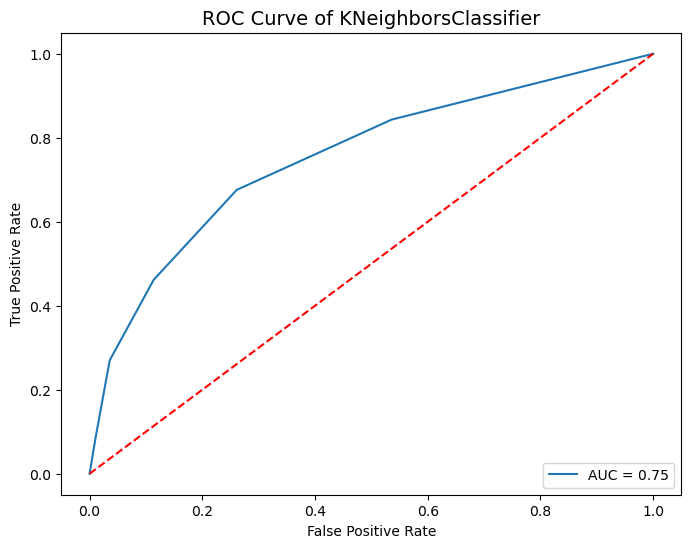

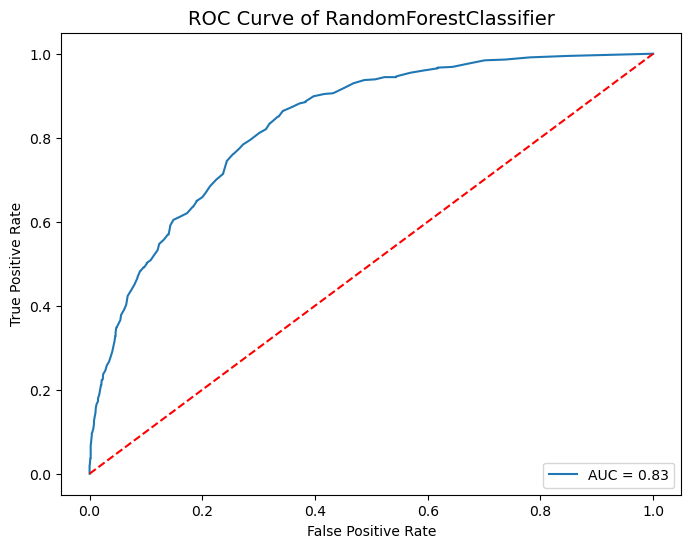

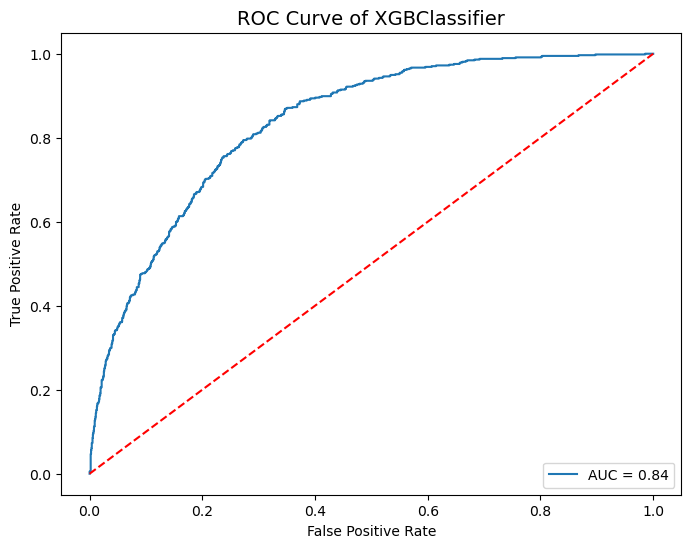

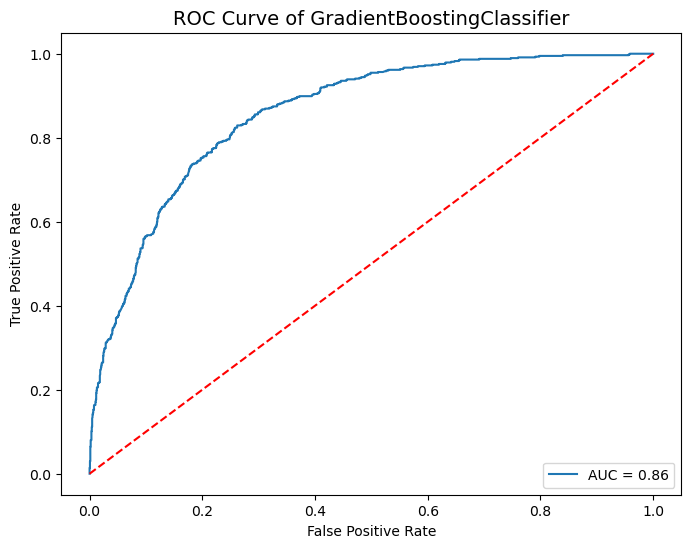

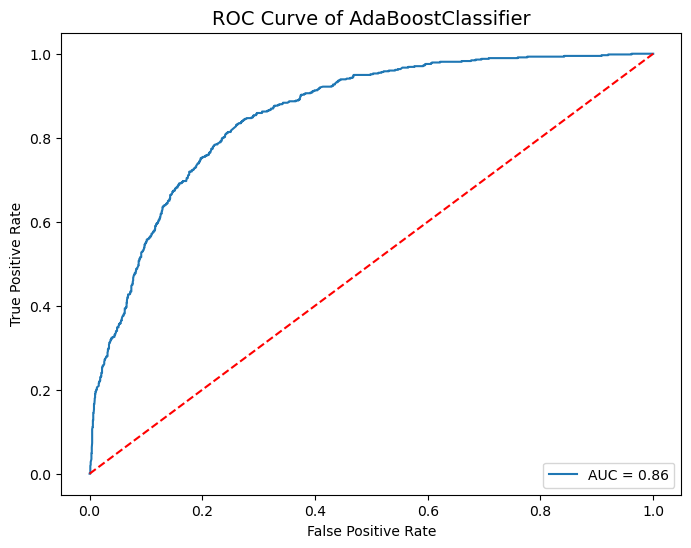

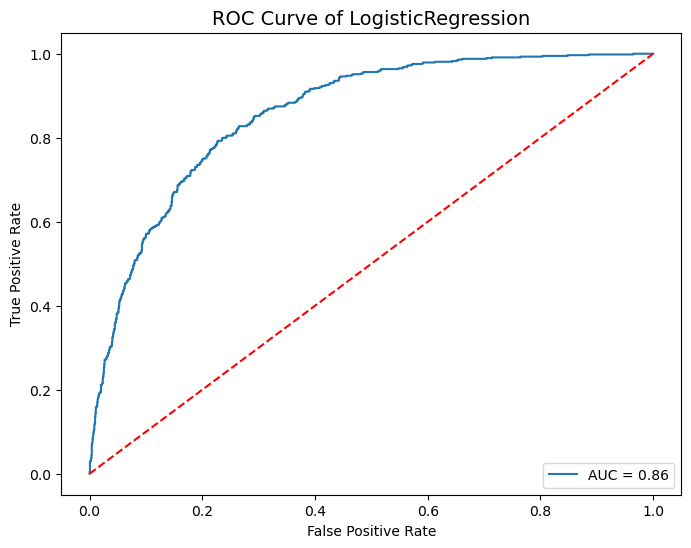

In [32]:
models = [knn, rfc, xgb,gbc, abc, lr]
for model in models:

    # ROC Curve:
    y_prob = model.predict_proba(X_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    plt.figure(figsize = (8, 6))
    plt.plot(fpr, tpr, label = "AUC = %0.2f" % roc_auc_score(y_test, y_prob))
    plt.plot([0, 1], [0, 1],'r--')
    plt.legend(loc = 'lower right')
    plt.title("ROC Curve of "+model.__class__.__name__, size = 14)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.show()

### After Auc-roc curve, I decided to eliminate KNeighborsClassifier and RandomForestClassifier models. Because they have the lowest auc-roc score.

<h1 style='background:#0A4D68; border:3; color:cyan; border-color:cyan; border-style:dotted;'><center> MODEL TUNING</center></h1> 

In [33]:
# Finding best hyperparameters for models
models = [xgb,gbc, abc, lr]

xgb_params= {'learning_rate': [0.1, 0.01, 0.05],
                'max_depth': [2, 3, 8],
                'n_estimators': [100, 200, 500]}

gbc_params= {'learning_rate': [0.1, 0.01, 0.05],
                'max_depth': [2, 3, 8],
                'n_estimators': [100, 200, 500]}
abc_params= {'learning_rate': [0.1, 0.01, 0.05],
                'n_estimators': [100, 200, 500]}
lr_params= {'C': [0.1, 1, 5, 10, 50, 100]}

params=[xgb_params, gbc_params, abc_params, lr_params]


for model in zip(models, params):
    grid_cv=GridSearchCV(model[0], model[1], cv=10, n_jobs=-1, verbose=2)
    grid_cv.fit(X_train, y_train)
    print(model[0], grid_cv.best_params_)
    

# Note: Normally I could add more parameters to the grid search but it takes too much time to run that's way 
# I just added some of them. You can add more parameters to the grid search to find the best hyperparameters by writing model.get_params().keys()

Fitting 10 folds for each of 27 candidates, totalling 270 fits
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...) {'learning_rate': 0.05, 'max_depth': 2, 'n_estimators': 500}
Fitting 10 folds for each of 27 candidates, totalling 270 fits
GradientBoostingClassifier() {'learning_rate': 0.05, 'max_dep

In [34]:
# Final models:


xgb=XGBClassifier(learning_rate=0.05,max_depth=2,n_estimators=500,random_state=42)
gbc=GradientBoostingClassifier(learning_rate=0.05,max_depth=2,n_estimators=200,random_state=42)
abc=AdaBoostClassifier(learning_rate=0.1,n_estimators=500,random_state=42)
lr=LogisticRegression(C=100,random_state=42)

models = [xgb,gbc, abc, lr]

overral=pd.DataFrame(columns=["Model","Accuracy Score","F1 Score","ROC AUC Score","R2 Score",
                              "Cross Val Score","RMSE","MAE","MSE","precision_score","recall_score"])
for model in models:
    
    model.fit(X_train,y_train)
    y_pred=model.predict(X_test)
    acc=accuracy_score(y_test,y_pred)
    f1=f1_score(y_test,y_pred)
    roc=roc_auc_score(y_test,y_pred)
    r2=r2_score(y_test,y_pred)
    cv=cross_val_score(model,X,y,cv=10).mean()
    rmse=np.sqrt(mean_squared_error(y_test,y_pred))
    mae=mean_absolute_error(y_test,y_pred)
    mse=mean_squared_error(y_test,y_pred)
    pr=precision_score(y_test,y_pred)
    rc=recall_score(y_test,y_pred)
    
    overral=overral._append({"Model":model.__class__.__name__,
                            "Accuracy Score":acc,
                            "F1 Score":f1,
                            "ROC AUC Score":roc,
                            "R2 Score":r2,
                            "Cross Val Score":cv,
                            "RMSE":rmse,
                            "MAE":mae,
                            "MSE":mse,
                            "precision_score":pr,
                            "recall_score":rc},ignore_index=True)
    

overral=overral.sort_values(by="Accuracy Score",ascending=False)
overral=overral.style.background_gradient(cmap="Spectral")
overral

,Model,Accuracy Score,F1 Score,ROC AUC Score,R2 Score,Cross Val Score,RMSE,MAE,MSE,precision_score,recall_score
3,LogisticRegression,0.808803,0.621013,0.736021,0.033659,0.802925,0.437261,0.191197,0.191197,0.672764,0.576655
2,AdaBoostClassifier,0.805017,0.595285,0.718128,0.014524,0.806758,0.441569,0.194983,0.194983,0.682432,0.527875
0,XGBClassifier,0.803124,0.590551,0.715190,0.004956,0.804059,0.443708,0.196876,0.196876,0.678733,0.522648
1,GradientBoostingClassifier,0.802177,0.585317,0.711809,0.000172,0.805054,0.444773,0.197823,0.197823,0.679724,0.513937


In [38]:
models = [ xgb,gbc, abc, lr]
for model in models:
    
    print("Model: ",model.__class__.__name__)
    fig=px.imshow(confusion_matrix(y_test,y_pred),color_continuous_scale='tropic',title="Confusion Matrix of "+model.__class__.__name__,
              labels=dict(x="Predicted",y="Actual",color="Counts"),color_continuous_midpoint=0.8,
              width=400,height=400,template="plotly_dark",text_auto=True)
    fig.show()
    print("----------------------------------------------------------")

Model:  XGBClassifier


----------------------------------------------------------
Model:  GradientBoostingClassifier


----------------------------------------------------------
Model:  AdaBoostClassifier


----------------------------------------------------------
Model:  LogisticRegression


----------------------------------------------------------


Text(0.5, 1.0, 'Actual vs Predicted')

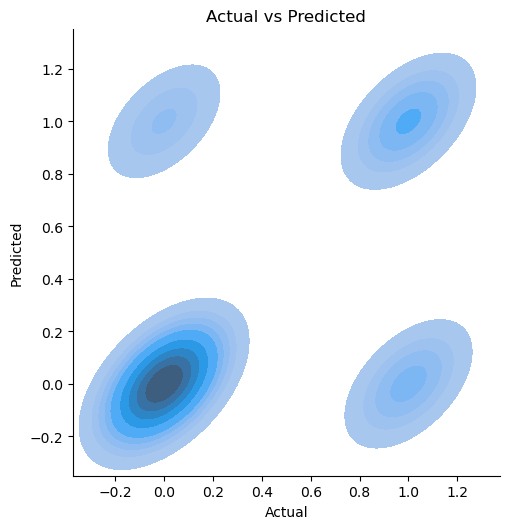

In [46]:
#visualizing prediction results:

lr=LogisticRegression(C=100,penalty='l2',solver='liblinear',random_state=42)
lr.fit(X_train,y_train)


y_pred = lr.predict(X_test)
y_pred = y_pred.reshape(-1,1)

y_test = y_test.reshape(-1,1)

sns.displot(x=y_test.flatten(),y=y_pred.flatten(),kind="kde",fill=True)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted")

<h1 style='background:#0A4D68; border:3; color:cyan; border-color:cyan; border-style:dotted;'><center> CONCLUSION</center></h1> 

# Conclusion
* Conclusion: Understanding and Predicting Customer Churn in Telco Services

* In this project, we embarked on a journey to understand and predict customer churn in the telecommunications industry using advanced machine learning techniques. Our primary objective was to build a robust classification model that could accurately predict whether a customer is likely to churn or not, based on a variety of features derived from the telco customer churn dataset.

* Through meticulous data preprocessing, feature engineering, and model training, we successfully constructed a logistic regression classification model that achieved an impressive accuracy score of 0.809. This score indicates that our model is adept at distinguishing between loyal customers and those at risk of churning.